In [1]:
import helper_functions
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from os import listdir
import matplotlib.patches as patches
from PIL import Image
from skimage.draw import line_aa
from mpl_toolkits.axes_grid1 import ImageGrid
from numpy import diff
from scipy import ndimage
from scipy.optimize import curve_fit
from numpy import inf
from numpy import interp
from skimage import data, img_as_float
from skimage import exposure
from scipy import ndimage, misc

In [2]:
path = '/Volumes/T7/data/830nm/1/'

In [3]:
images = helper_functions.get_images(path, "73320")
#images = helper_functions.get_images(path, "52209")
#images = helper_functions.get_images(path, "199653")

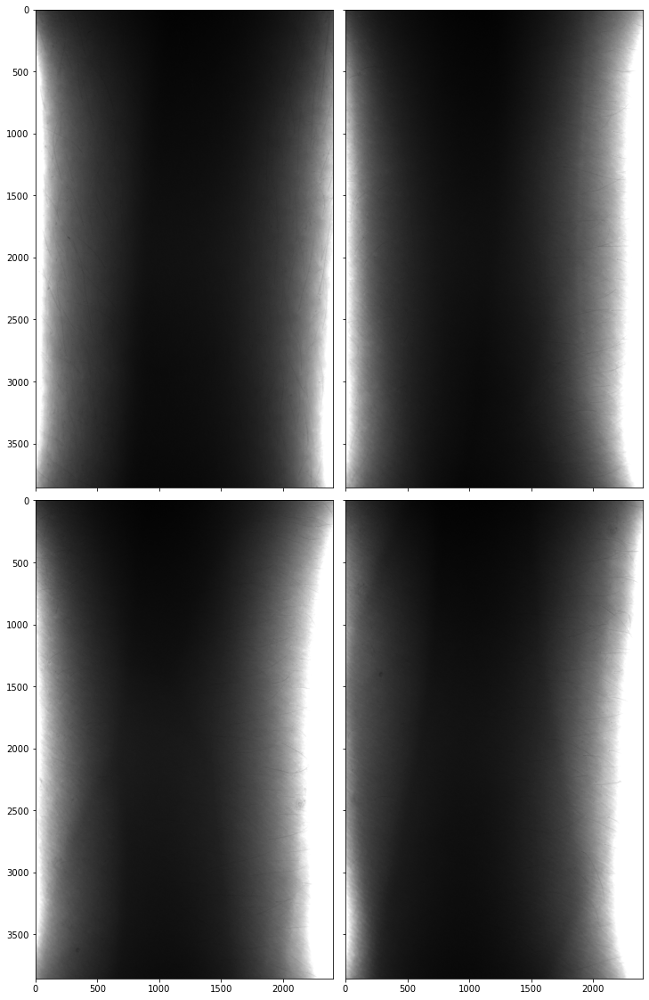

In [4]:
helper_functions.show_grid_of(images, (2,2))

In [5]:
log_images = helper_functions.log_transform(images)

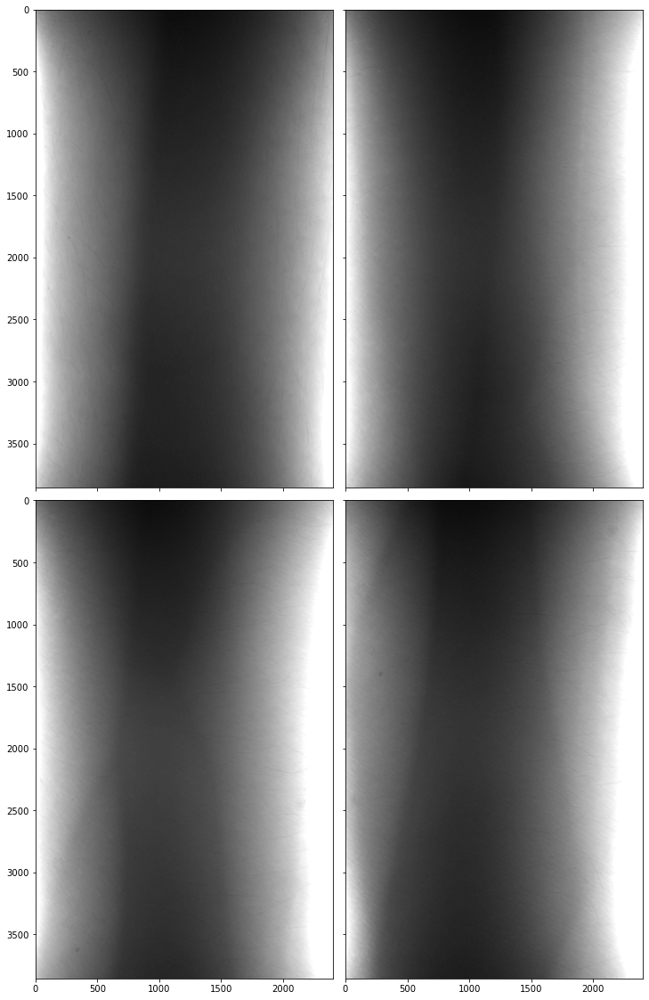

In [6]:
helper_functions.show_grid_of(log_images, (2,2))

In [4]:
gamma_images = helper_functions.gamma_mapping(images, gamma=0.05)

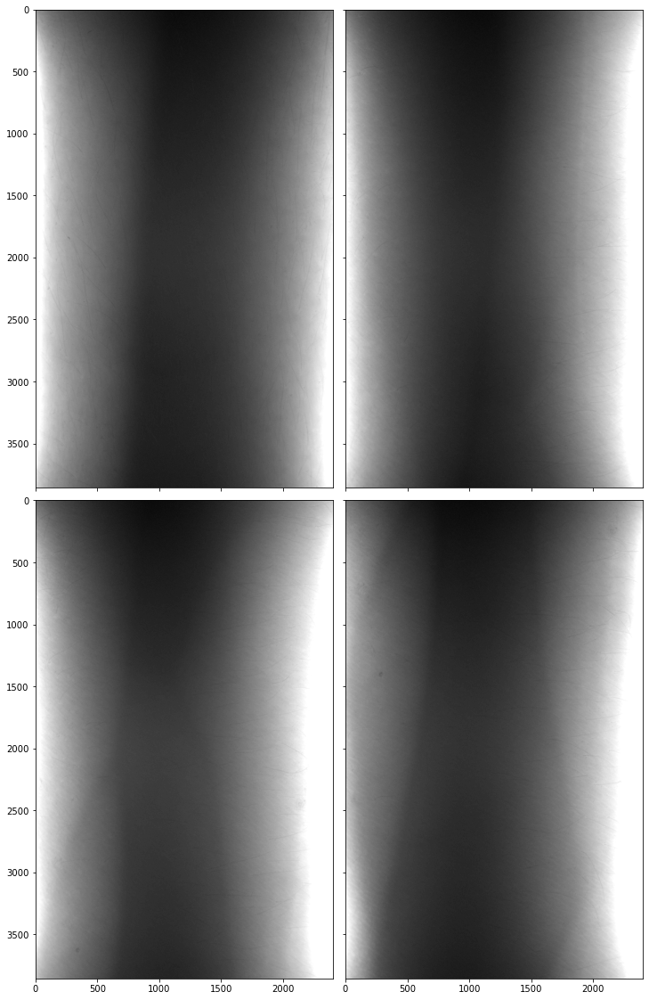

In [8]:
helper_functions.show_grid_of(gamma_images, (2,2))

In [5]:
median = helper_functions.get_mean_image(gamma_images)

In [6]:
subs = helper_functions.median_subtraction(gamma_images, median)

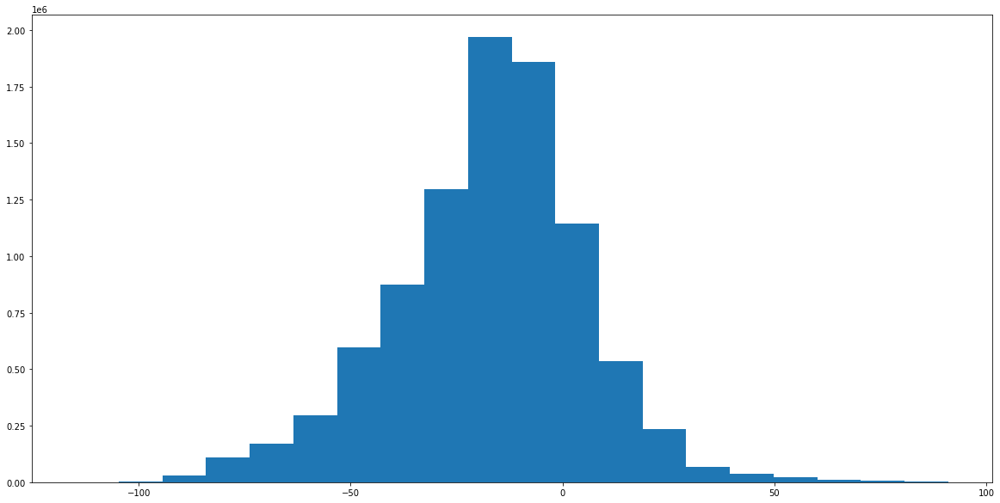

In [11]:
helper_functions.plot_hist(subs[0])

In [12]:
mapped = helper_functions.map_percentile_bounds(subs, bounds=(0, 100))

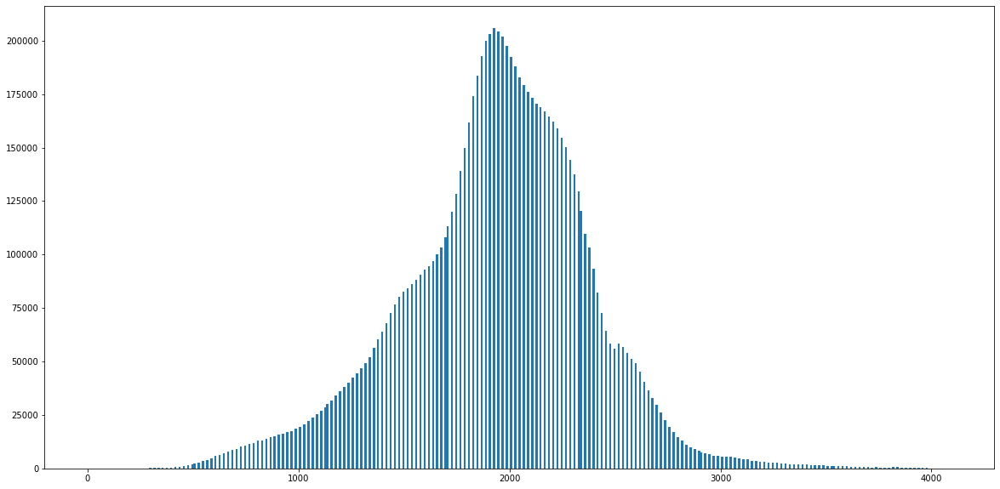

In [13]:
helper_functions.plot_hist(mapped[0])

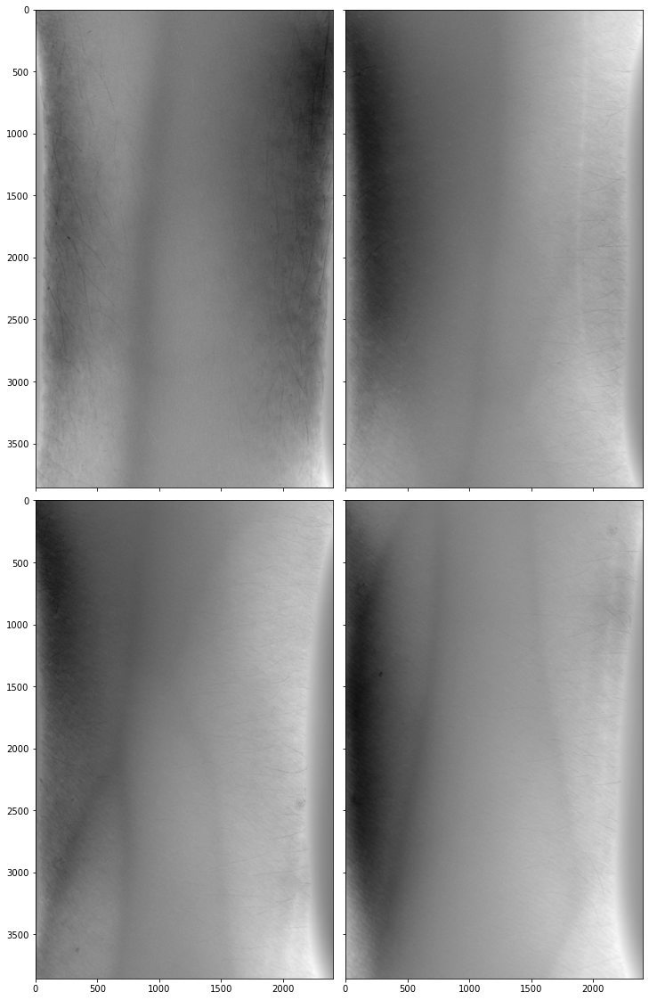

In [14]:
helper_functions.show_grid_of(mapped, (2,2))

In [7]:
background_subtracted = helper_functions.mean_filter_subtraction(gamma_images, size=(400,400))

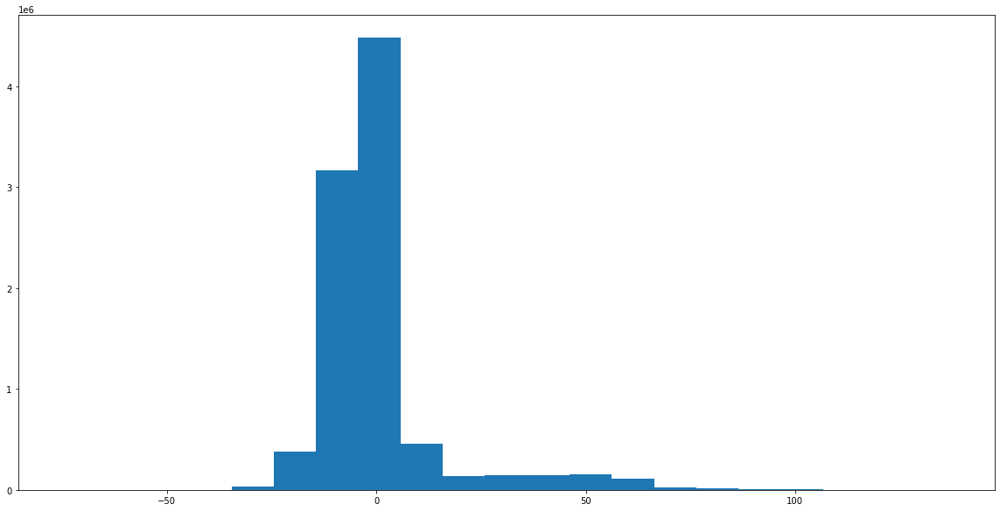

In [8]:
helper_functions.plot_hist(background_subtracted[0])

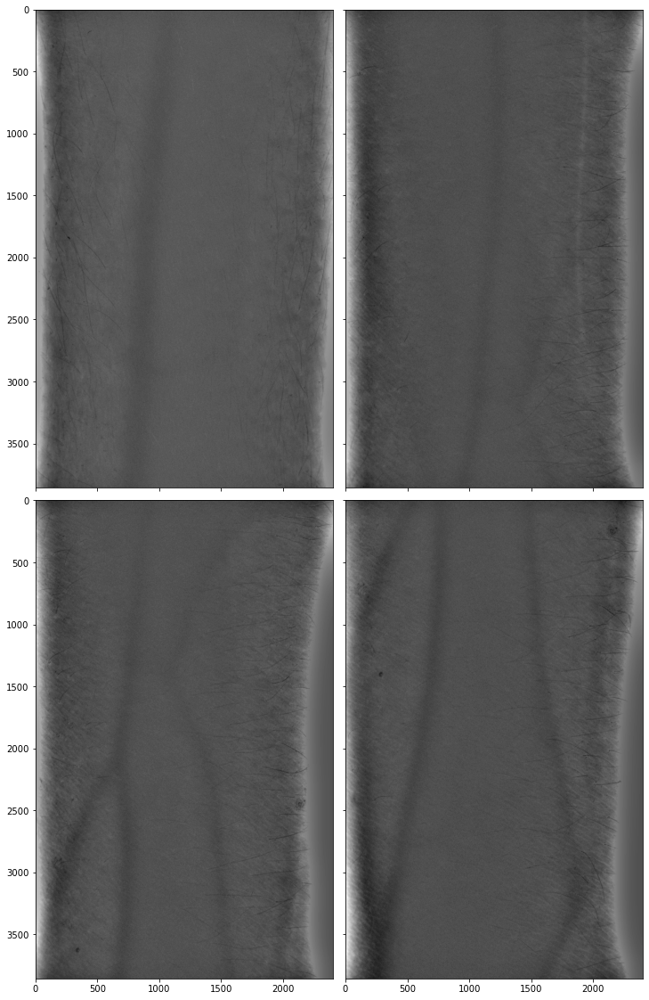

In [9]:
helper_functions.show_grid_of(background_subtracted, (2,2))

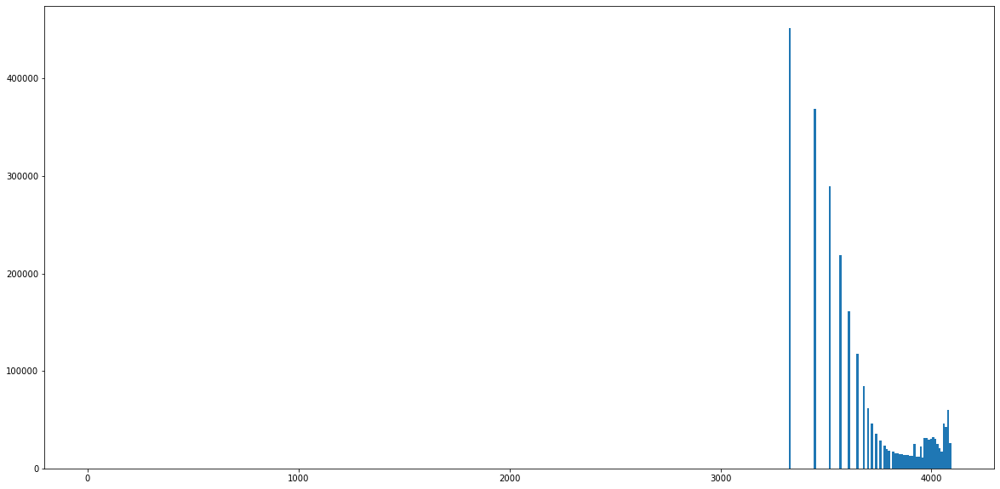

In [18]:
gamma_images_2 = helper_functions.gamma_mapping(background_subtracted, gamma=0.05)
mapped_2 = helper_functions.map_percentile_bounds(gamma_images_2, bounds=(1, 99))
helper_functions.plot_hist(mapped_2[0])

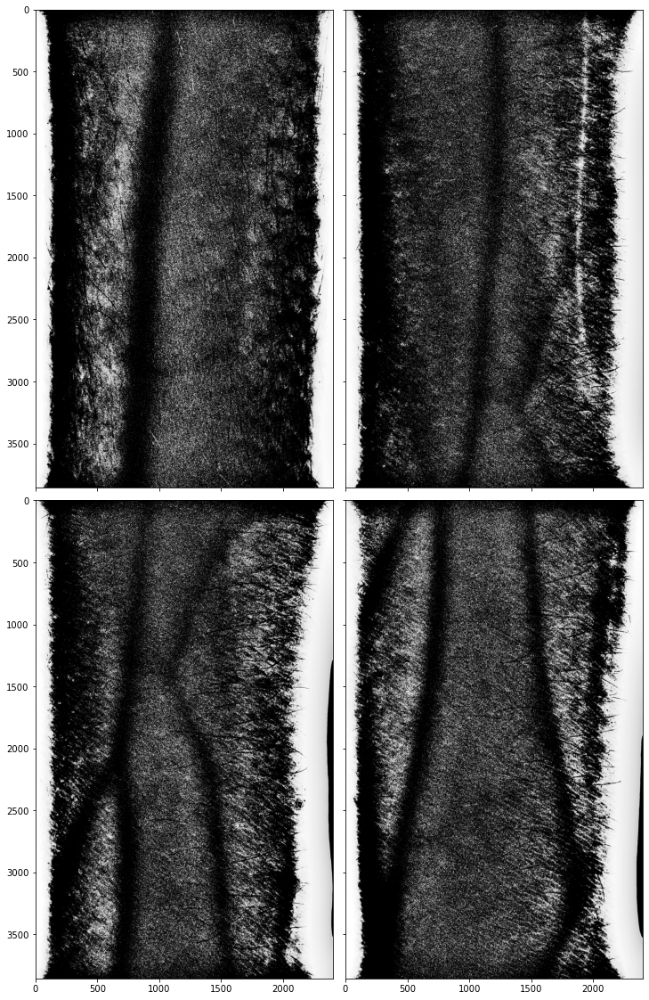

In [19]:
helper_functions.show_grid_of(mapped_2, (2,2))

In [10]:
background_subtracted_2 = helper_functions.mean_filter_subtraction(subs, size=(400,400))

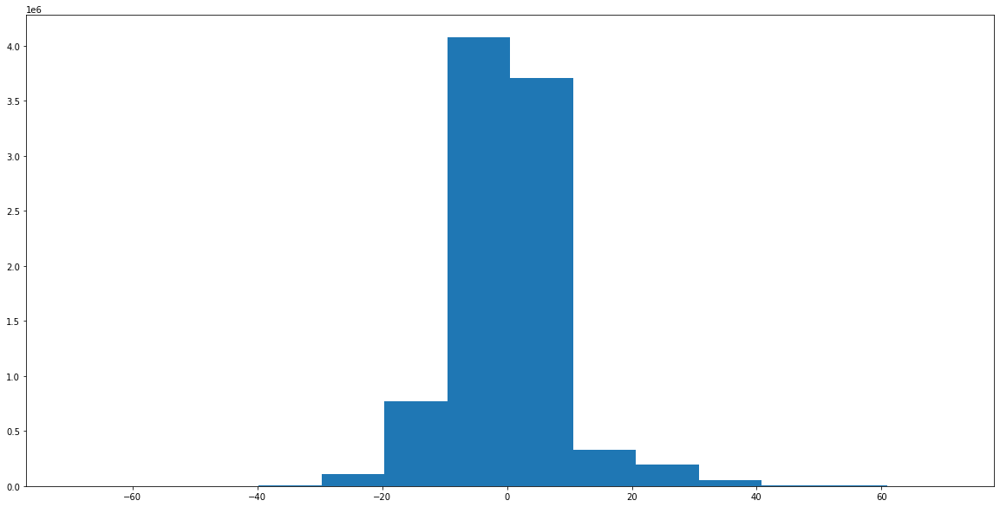

In [11]:
helper_functions.plot_hist(background_subtracted_2[0])

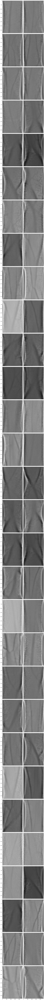

In [12]:
helper_functions.show_grid_of(background_subtracted_2, (2,2))